### Installing Required Dependencies: Ultralytics and Roboflow

In [2]:
# Install necessary Python libraries: Ultralytics and Roboflow
# Ultralytics: Provides YOLO models for object detection
# Roboflow: Used for dataset management and model training integration

!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 9.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.11.0.86
    Uninstalling opencv-python-headless-4.11.0.86:
      Successfully uninstalled opencv-python-headless-4.11.0.86
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


Downloading dataset from Robotflow

### Downloading YOLO Dataset from Roboflow Using API Key from Environment Variables

In [3]:
import os  # Import OS module to access environment variables
from roboflow import Roboflow  # Import Roboflow module for dataset management

def download_dataset():
    """
    Downloads a YOLOv11 dataset from Roboflow by securely accessing the API key from environment variables.

    Steps:
    - Reads the API key from an environment variable.
    - Connects to the specified Roboflow workspace and project.
    - Downloads the dataset version in YOLOv11 format.

    Ensure that the API key is stored as an environment variable named 'ROBOFLOW_API_KEY'.
    """

    # Retrieve API key from environment variables (ensure it's set before running the script)
    api_key = os.getenv("ROBOFLOW_API_KEY")
    if api_key is None:
        raise ValueError("Error: ROBOFLOW_API_KEY environment variable not set.")

    # Initialize Roboflow with the API key
    rf = Roboflow(api_key=api_key)

    # Access the specific project and dataset version
    project = rf.workspace("medicalimage-z4t5b").project("mdtech")
    version = project.version(1)

    # Download the dataset in YOLOv11 format
    dataset = version.download("yolov11")
    return dataset

# Execute the function to download the dataset
download_dataset()


loading Roboflow workspace...
loading Roboflow project...
Exporting format yolov11 in progress : 85.0%
Version export complete for yolov11 format



Extracting Dataset Version Zip to mdtech-1 in yolov11:: 100%|██████████| 670/670 [00:00<00:00, 1326.61it/s]


### Modifying a YOLO Dataset Configuration YAML File

In [4]:
import yaml  # Import YAML library to handle YAML file operations
import os    # Import OS module to manage file paths

def modify_yaml(file_path):
    """
    Modifies a dataset configuration YAML file by updating the paths for training, validation, and test data.

    Parameters:
    file_path (str): The path to the YAML file that needs modification.

    Functionality:
    - Reads the YAML file.
    - Updates the paths for 'train', 'val', and 'test' datasets.
    - Writes the modified data back to the YAML file.
    """

    # Load the existing YAML file
    with open(file_path, 'r') as file:
        data = yaml.safe_load(file)  # Safely parse YAML content

    # Get current working directory and define the dataset path
    content_path = os.path.join(os.getcwd(), "mdtech-1")

    # Update dataset paths in the YAML file
    data["train"] = f"{content_path}/train/images"  # Path to training images
    data["val"] = f"{content_path}/valid/images"    # Path to validation images
    data["test"] = f"{content_path}/test/images"    # Path to test images

    # Write the modified data back to the YAML file
    with open(file_path, 'w') as file:
        yaml.dump(data, file, default_flow_style=False)  # Save YAML with human-readable formatting

# Example usage: Modify the dataset configuration file
modify_yaml("/content/mdtech-1/data.yaml")


### Training YOLO v12 Model with Custom Dataset and Hyperparameters"

In [30]:
from ultralytics import YOLO  # Import the YOLO module from the Ultralytics library

# Load the YOLO model (pretrained weights)
model = YOLO("yolo12m.pt")  # Load the YOLO model with the specified weights

# Train the model with custom dataset and hyperparameters
result_11m = model.train(
    data="/content/mdtech-1/data.yaml",  # Path to dataset configuration file
    epochs=100,      # Number of training epochs
    batch=16,        # Batch size (number of images processed per step)
    imgsz=640,       # Input image size (height and width)
    device=0         # GPU device ID (0 for first available GPU, -1 for CPU)
)

Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo12m.pt, data=/content/mdtech-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning /content/mdtech-1/train/labels.cache... 288 images, 0 backgrounds, 0 corrupt: 100%|██████████| 288/288 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/mdtech-1/valid/labels.cache... 21 images, 0 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<?, ?it/s]


Plotting labels to runs/detect/train7/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 123 weight(decay=0.0), 130 weight(decay=0.0005), 129 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train7
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      11.6G      2.195      3.839      2.187         24        640: 100%|██████████| 18/18 [00:15<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         21         22     0.0458      0.364     0.0299    0.00911



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      11.4G      1.776      2.076      1.785         38        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.89it/s]

                   all         21         22          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      11.5G      1.809      1.687      1.885         40        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         21         22     0.0233     0.0455    0.00347    0.00104



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      11.4G      1.852      1.656      1.922         33        640: 100%|██████████| 18/18 [00:14<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22     0.0437     0.0455     0.0102    0.00204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      11.4G      1.815      1.534      1.915         33        640: 100%|██████████| 18/18 [00:14<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         21         22     0.0047      0.727    0.00426    0.00166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      11.4G       1.72      1.557      1.845         29        640: 100%|██████████| 18/18 [00:14<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         21         22      0.833      0.227      0.266      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      11.4G      1.758      1.494      1.841         29        640: 100%|██████████| 18/18 [00:14<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         21         22        0.4      0.273      0.216      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      11.4G      1.591      1.372      1.777         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         21         22      0.454      0.773      0.518      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      11.4G       1.66      1.356      1.801         32        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all         21         22      0.192      0.182     0.0996     0.0457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      11.4G      1.612       1.27      1.725         33        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         21         22      0.524      0.545      0.633      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      11.4G      1.679      1.382      1.789         36        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         21         22      0.766      0.448      0.475      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      11.4G      1.681      1.394      1.771         29        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         21         22       0.96      0.409      0.515      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      11.4G      1.531      1.255      1.646         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         21         22      0.755      0.773      0.808      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      11.4G      1.561      1.174      1.688         30        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         21         22      0.861      0.844      0.802      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      11.4G      1.509      1.111      1.611         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         21         22      0.949      0.848      0.932      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      11.4G      1.496      1.098      1.611         34        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         21         22      0.994      0.909      0.951      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      11.4G      1.458      1.074      1.587         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.112      0.636       0.12     0.0599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      11.4G      1.502      1.023      1.618         29        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.852      0.784       0.89      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      11.4G      1.498      1.059      1.637         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.867      0.955      0.937      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      11.4G      1.505      1.083      1.617         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         21         22      0.912       0.94      0.947      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      11.4G      1.459     0.9843      1.595         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         21         22      0.901      0.827      0.934      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      11.4G      1.462      1.048      1.613         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.978      0.955      0.956      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      11.4G      1.483      1.062      1.631         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         21         22      0.986      0.955      0.955      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      11.4G      1.443      1.063      1.605         21        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.972      0.955      0.956      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      11.4G      1.479      0.984      1.602         23        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         21         22      0.841      0.909      0.912      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      11.4G      1.433     0.9936      1.598         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         21         22      0.984      0.955      0.955      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      11.4G      1.426     0.9615      1.574         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         21         22      0.975      0.955      0.956      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      11.4G      1.481     0.9786      1.599         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         21         22      0.511      0.664      0.649      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      11.4G      1.445      1.023      1.616         39        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         21         22      0.889      0.955      0.929      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      11.4G      1.415     0.9396      1.533         35        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         21         22        0.9      0.955      0.949      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      11.4G      1.442     0.9777       1.58         36        640: 100%|██████████| 18/18 [00:14<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         21         22      0.972      0.955      0.956      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      11.4G      1.387     0.9649      1.522         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         21         22      0.966      0.955      0.956      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      11.4G       1.38     0.9139      1.521         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         21         22      0.993      0.955      0.955      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      11.4G      1.384     0.8647      1.538         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.975      0.955      0.955      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      11.4G      1.366      0.897      1.511         35        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         21         22          1      0.941      0.956      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      11.4G      1.335     0.8909       1.52         36        640: 100%|██████████| 18/18 [00:15<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         21         22      0.997      0.955      0.956      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      11.4G      1.368     0.8512      1.569         27        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         21         22      0.996      0.955      0.956       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      11.4G      1.321     0.8611      1.506         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         21         22      0.954      0.952      0.951      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      11.4G      1.325     0.8633      1.509         39        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         21         22       0.98      0.909      0.953      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      11.4G       1.38     0.8776      1.562         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

                   all         21         22      0.985      0.955      0.956       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      11.4G      1.274     0.8192      1.476         36        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.941      0.909      0.944      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      11.4G      1.279     0.7799      1.481         34        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.82it/s]

                   all         21         22      0.988      0.955      0.956       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      11.4G       1.31     0.7995      1.497         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.906      0.909      0.949      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      11.4G      1.287     0.8037      1.505         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         21         22       0.98      0.955      0.956      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      11.4G      1.293     0.8023      1.455         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         21         22      0.942      0.909      0.948      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      11.4G       1.31     0.8196       1.48         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         21         22      0.991      0.955      0.957      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      11.4G       1.24     0.7838       1.44         27        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         21         22          1      0.948      0.957      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      11.4G      1.256     0.7786      1.444         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22       0.99      0.955      0.956      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      11.4G      1.294     0.8056      1.495         36        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         21         22      0.975      0.909      0.951      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      11.4G      1.267     0.7639      1.486         26        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         21         22      0.907      0.955      0.941      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      11.4G      1.295     0.8107      1.485         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         21         22      0.994      0.955      0.956      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      11.4G      1.214     0.7484      1.411         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         21         22      0.953      0.955      0.956      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.4G      1.255     0.7388      1.432         34        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         21         22      0.997      0.909      0.906      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      11.4G      1.173     0.6915      1.377         39        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

                   all         21         22      0.987      0.955      0.956      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      11.4G      1.199     0.7219      1.399         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         21         22      0.988      0.955      0.957      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      11.4G      1.192     0.6725      1.371         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         21         22      0.937      0.955      0.944      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      11.4G      1.223     0.7109      1.418         35        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         21         22      0.952      0.955      0.956       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      11.4G      1.221     0.7119      1.435         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         21         22      0.988      0.955      0.958      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      11.4G       1.22      0.714      1.403         29        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         21         22      0.961      0.955      0.957      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      11.4G      1.195     0.6832      1.403         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         21         22      0.947      0.955      0.949      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      11.4G      1.168     0.6584      1.351         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         21         22      0.918      0.955      0.946      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      11.4G      1.143     0.6605      1.369         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         21         22      0.987      0.955      0.957      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      11.4G      1.181     0.6849      1.398         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         21         22      0.993      0.955      0.959      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      11.4G      1.147     0.6482      1.379         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         21         22      0.996      0.955      0.957      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      11.4G      1.161     0.6751      1.369         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.995      0.955      0.957       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      11.4G      1.159     0.6438      1.353         36        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

                   all         21         22      0.994      0.955      0.958      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      11.4G      1.115     0.6848      1.323         38        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         21         22      0.994      0.955      0.956      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      11.4G      1.107     0.6329      1.351         25        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         21         22      0.991      0.955      0.956      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      11.4G      1.102     0.6196      1.337         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         21         22      0.996      0.955      0.957      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      11.4G      1.151     0.6402      1.346         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         21         22      0.946      0.909      0.905      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      11.4G       1.11      0.629      1.346         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         21         22      0.994      0.955      0.957      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      11.4G      1.132     0.6254      1.366         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         21         22      0.947      0.955      0.948      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      11.4G       1.09     0.5931      1.358         20        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         21         22      0.983      0.909      0.949      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      11.4G      1.079     0.6244      1.342         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         21         22       0.99      0.955      0.964       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      11.4G      1.083     0.5936      1.328         34        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         21         22      0.954      0.947      0.956      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      11.4G      1.093     0.6235      1.331         29        640: 100%|██████████| 18/18 [00:15<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         21         22      0.976      0.909      0.912      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      11.4G      1.083     0.6344      1.329         32        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         21         22      0.929      0.909      0.934      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      11.4G      1.033     0.5824      1.282         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         21         22      0.987      0.955      0.958      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.4G      1.073      0.585      1.309         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         21         22      0.993      0.955      0.961      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      11.4G      1.012     0.5859      1.289         28        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         21         22      0.996      0.955      0.961      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      11.4G      1.034     0.5863      1.279         27        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         21         22      0.995      0.955      0.967      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      11.4G      1.024     0.5776      1.263         33        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         21         22      0.994      0.955      0.964      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      11.4G      1.018      0.574      1.277         37        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.988      0.955      0.966       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      11.4G      1.034     0.5653        1.3         39        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         21         22      0.941      0.909      0.944      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      11.4G     0.9868     0.5375      1.269         26        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         21         22      0.908      0.897      0.947      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      11.4G     0.9982     0.5534      1.251         38        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]

                   all         21         22      0.992      0.864      0.951      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      11.4G      0.991     0.5395      1.267         30        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         21         22      0.986      0.864      0.958      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      11.4G      1.019     0.5672      1.269         31        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         21         22      0.973      0.864      0.902      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      11.4G      0.959     0.5742       1.24         29        640: 100%|██████████| 18/18 [00:15<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         21         22      0.951      0.955      0.955      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      11.4G     0.9644      0.517       1.24         32        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         21         22      0.952      0.955      0.956      0.592


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      11.4G     0.8912     0.4429      1.265         16        640: 100%|██████████| 18/18 [00:17<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         21         22      0.993      0.955      0.962      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      11.4G      0.904     0.4312      1.268         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         21         22      0.995      0.955      0.965      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      11.4G     0.8898     0.4159      1.252         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         21         22      0.944      0.909      0.923      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      11.4G     0.8652     0.4135      1.222         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.22it/s]

                   all         21         22      0.913      0.954       0.96      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      11.4G     0.8645     0.4063      1.231         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         21         22      0.996      0.955      0.966      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      11.4G     0.8187     0.3862      1.201         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         21         22      0.996      0.955      0.967      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      11.4G     0.8449     0.3953      1.215         16        640: 100%|██████████| 18/18 [00:14<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         21         22      0.997      0.955      0.969      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      11.4G     0.8316     0.3822      1.212         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         21         22      0.997      0.955       0.97       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      11.4G     0.8158     0.3897      1.193         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         21         22      0.997      0.955      0.969      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      11.4G     0.8207     0.3882       1.21         16        640: 100%|██████████| 18/18 [00:15<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

                   all         21         22      0.997      0.955      0.971      0.619



100 epochs completed in 0.538 hours.
Optimizer stripped from runs/detect/train7/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/train7/weights/best.pt, 40.8MB

Validating runs/detect/train7/weights/best.pt...
Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 169 layers, 20,105,683 parameters, 0 gradients, 67.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


                   all         21         22      0.994      0.955      0.956      0.693
Speed: 0.2ms preprocess, 11.5ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/train7


### Training YOLO v11 Model with Custom Dataset and Hyperparameters

In [31]:
from ultralytics import YOLO  # Import the YOLO module from the Ultralytics library

# Load the YOLO model (pretrained weights)
model = YOLO("yolo11m.pt")  # Load the YOLO model with the specified weights

# Train the model with custom dataset and hyperparameters
result_11m = model.train(
    data="/content/mdtech-1/data.yaml",  # Path to dataset configuration file
    epochs=100,      # Number of training epochs
    batch=16,        # Batch size (number of images processed per step)
    imgsz=640,       # Input image size (height and width)
    device=0         # GPU device ID (0 for first available GPU, -1 for CPU)
)

Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=/content/mdtech-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

train: Scanning /content/mdtech-1/train/labels.cache... 288 images, 0 backgrounds, 0 corrupt: 100%|██████████| 288/288 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/mdtech-1/valid/labels.cache... 21 images, 0 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<?, ?it/s]


Plotting labels to runs/detect/train8/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train8
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.54G      2.142       3.59      2.217         24        640: 100%|██████████| 18/18 [00:13<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         21         22      0.474      0.409      0.395      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.26G       1.74      1.902      1.817         38        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22     0.0667      0.273     0.0506     0.0182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.26G      1.822      1.604      1.866         40        640: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         21         22     0.0017      0.455    0.00128   0.000254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      8.21G      1.723      1.504      1.799         33        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

                   all         21         22    0.00385      0.227    0.00251   0.000368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.21G      1.766      1.613      1.868         33        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

                   all         21         22   0.000648     0.0455   0.000514   5.14e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.26G      1.785      1.626      1.859         29        640: 100%|██████████| 18/18 [00:10<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         21         22          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.21G      1.605      1.296       1.69         29        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

                   all         21         22          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      8.26G      1.573      1.194      1.709         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         21         22     0.0118      0.545     0.0124    0.00516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.21G      1.562      1.197      1.668         32        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.58it/s]

                   all         21         22      0.103      0.909      0.106     0.0585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.26G      1.498      1.098      1.603         33        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         21         22      0.121      0.864      0.117     0.0523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.21G      1.543      1.177      1.654         36        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         21         22      0.563      0.644      0.604      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      8.26G      1.553      1.151       1.65         29        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         21         22      0.952      0.897       0.95      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.21G      1.523      1.122      1.661         25        640: 100%|██████████| 18/18 [00:11<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         21         22      0.967      0.955      0.955      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      8.26G       1.58      1.077       1.69         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

                   all         21         22      0.979      0.955      0.955      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.21G      1.505       1.07      1.611         31        640: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         21         22      0.899      0.727      0.838      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      8.26G      1.452      1.015      1.584         34        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

                   all         21         22       0.99      0.955      0.956      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.21G      1.439     0.9931      1.583         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         21         22      0.954      0.934      0.954      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.26G      1.524          1      1.629         29        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         21         22      0.952      0.899      0.947      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.21G      1.454      0.957      1.598         31        640: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         21         22      0.858      0.773      0.889      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      8.26G      1.467     0.9908      1.571         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

                   all         21         22      0.993      0.955      0.957       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.21G      1.403     0.9265      1.534         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         21         22      0.954      0.943      0.953      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      8.26G      1.404     0.9525      1.562         37        640: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

                   all         21         22          1      0.952      0.956        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.21G      1.422     0.9272      1.553         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         21         22          1      0.898      0.943      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      8.26G      1.442      1.001      1.578         21        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

                   all         21         22      0.902      0.955      0.947      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.21G       1.43     0.9007      1.552         23        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

                   all         21         22      0.935      0.955      0.951      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.26G      1.435     0.8846      1.567         31        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         21         22          1      0.951      0.956      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.21G      1.437     0.9051      1.543         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         21         22      0.948      0.955      0.953      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      8.26G      1.412     0.8742      1.521         33        640: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         21         22       0.99      0.955      0.956      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.21G      1.419      0.941       1.57         39        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

                   all         21         22       0.97      0.909      0.953      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      8.26G      1.353     0.8199      1.495         35        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         21         22      0.943      0.955      0.955      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.21G      1.409     0.8673      1.513         36        640: 100%|██████████| 18/18 [00:10<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         21         22      0.973      0.955      0.955      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      8.26G      1.376     0.8808      1.491         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         21         22      0.983      0.955      0.955      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.21G      1.303     0.7945      1.439         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

                   all         21         22      0.941      0.955      0.953      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      8.26G      1.337     0.8035      1.484         37        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

                   all         21         22       0.99      0.955      0.956      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.21G      1.352     0.8367      1.471         35        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         21         22      0.982      0.955      0.957      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      8.26G      1.317     0.8055      1.461         36        640: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         21         22      0.997      0.955      0.956      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.21G      1.335     0.7939       1.49         27        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

                   all         21         22      0.943      0.955      0.949      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      8.26G      1.322     0.7798      1.437         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

                   all         21         22      0.954      0.949      0.953      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.21G      1.276     0.7731       1.43         39        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         21         22      0.943      0.955      0.953       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      8.26G      1.283     0.7303      1.439         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         21         22      0.994      0.955      0.956      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.21G      1.233     0.7132      1.403         36        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         21         22      0.824      0.955      0.934      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      8.26G      1.255     0.6903      1.411         34        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         21         22      0.991      0.955      0.956      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.21G      1.239     0.7121      1.425         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         21         22      0.996      0.955      0.956      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      8.26G      1.239     0.7237      1.449         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         21         22      0.996      0.955      0.957       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.21G      1.191      0.705      1.374         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         21         22      0.993      0.955      0.958       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      8.26G      1.207     0.7238      1.378         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

                   all         21         22       0.99      0.864      0.901      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.21G      1.164      0.677      1.357         27        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         21         22      0.931      0.909      0.932      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      8.26G      1.204     0.6899      1.393         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

                   all         21         22      0.989      0.955      0.959      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.21G      1.228     0.7066      1.406         36        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         21         22      0.993      0.909      0.907      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      8.26G      1.188     0.6869       1.39         26        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

                   all         21         22      0.998      0.955      0.956      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.21G       1.18     0.6861      1.391         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

                   all         21         22      0.989      0.955      0.959      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      8.26G      1.155     0.6575       1.33         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

                   all         21         22       0.91      0.955      0.956       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.21G      1.205     0.6787      1.364         34        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         21         22      0.992      0.955       0.96      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      8.26G      1.156     0.6354      1.325         39        640: 100%|██████████| 18/18 [00:10<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         21         22       0.99      0.955      0.958      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.21G      1.197     0.6708      1.346         31        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         21         22      0.996      0.955      0.958      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      8.26G      1.154     0.6255      1.312         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

                   all         21         22      0.989      0.955      0.956      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.21G      1.167     0.6474      1.341         35        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         21         22      0.947      0.909      0.906      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      8.26G      1.166     0.6735       1.36         28        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

                   all         21         22      0.987      0.955      0.958      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.21G      1.151     0.6589      1.339         29        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         21         22      0.989      0.955       0.96      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      8.26G      1.143     0.6128       1.34         30        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

                   all         21         22      0.992      0.955      0.958      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.21G      1.078     0.5841      1.284         33        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         21         22      0.995      0.955      0.958      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      8.26G       1.09     0.5736      1.294         37        640: 100%|██████████| 18/18 [00:11<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22      0.995      0.955      0.959      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.21G      1.122     0.6061      1.329         37        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         21         22      0.995      0.955      0.962      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      8.26G       1.03     0.5672      1.281         30        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         21         22      0.997      0.955      0.959      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.21G      1.081     0.6049      1.282         31        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         21         22      0.997      0.955      0.958      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      8.26G      1.089     0.5809       1.29         36        640: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22      0.996      0.955      0.956      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.21G       1.01     0.5958      1.244         38        640: 100%|██████████| 18/18 [00:10<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

                   all         21         22      0.995      0.955      0.956      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      8.26G      1.046     0.5702      1.289         25        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         21         22      0.992      0.955      0.957      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.21G      1.037     0.5747       1.28         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         21         22      0.995      0.955      0.957      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.26G      1.046      0.577      1.263         33        640: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22      0.997      0.955      0.957      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.21G      1.042     0.5596      1.265         37        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         21         22      0.997      0.955      0.958      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      8.26G      1.036     0.5586      1.281         33        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         21         22      0.951      0.955      0.954      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.21G      0.967     0.5261      1.251         20        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         21         22      0.997      0.955      0.957      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      8.26G     0.9764     0.5454      1.246         33        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         21         22      0.996      0.955      0.958      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.21G      1.013     0.5399      1.244         34        640: 100%|██████████| 18/18 [00:11<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         21         22      0.996      0.955      0.958      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.26G     0.9949      0.568      1.255         29        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         21         22      0.991      0.955      0.957      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.21G     0.9674     0.5526      1.234         32        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         21         22      0.954      0.946      0.954      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      8.26G     0.9642     0.5212       1.22         31        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         21         22      0.997      0.955      0.957       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.21G      0.998     0.5356      1.229         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22      0.951      0.955      0.955      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      8.26G     0.9406     0.5217      1.226         28        640: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         21         22      0.995      0.955      0.958      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.21G     0.9761     0.5313      1.223         27        640: 100%|██████████| 18/18 [00:10<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

                   all         21         22      0.996      0.955      0.959      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      8.26G     0.9381     0.5063      1.186         33        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

                   all         21         22      0.997      0.955       0.96      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.21G     0.9283     0.4953      1.191         37        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         21         22      0.997      0.955       0.96      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      8.26G     0.9379      0.505      1.228         39        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

                   all         21         22      0.997      0.955      0.956      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.21G     0.8924     0.4777      1.188         26        640: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

                   all         21         22      0.997      0.955      0.957      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      8.26G     0.8968     0.4834       1.17         38        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.33it/s]

                   all         21         22      0.997      0.955      0.958      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.21G     0.9282     0.4814      1.193         30        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         21         22      0.997      0.955      0.959      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      8.26G     0.9474     0.4987      1.187         31        640: 100%|██████████| 18/18 [00:11<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         21         22      0.997      0.955      0.963      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.21G     0.8727     0.4907      1.165         29        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         21         22      0.997      0.955      0.963      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      8.26G     0.8927     0.4799      1.174         32        640: 100%|██████████| 18/18 [00:11<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.97it/s]

                   all         21         22      0.997      0.955      0.969      0.682


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.21G     0.8306      0.395      1.191         16        640: 100%|██████████| 18/18 [00:13<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         21         22      0.997      0.955      0.968      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      8.26G     0.8719     0.3998      1.213         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         21         22      0.997      0.955      0.969      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.21G     0.8248     0.3788      1.185         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         21         22      0.997      0.955      0.964      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      8.26G     0.7844     0.3523      1.147         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         21         22      0.997      0.955      0.961      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.21G     0.8011      0.362      1.156         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         21         22      0.997      0.955      0.961      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      8.26G     0.7648     0.3392      1.147         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         21         22      0.997      0.955      0.962      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.21G     0.7661     0.3487      1.143         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         21         22      0.997      0.955      0.962      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      8.26G     0.7616     0.3427      1.141         16        640: 100%|██████████| 18/18 [00:11<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         21         22      0.997      0.955      0.962      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.21G     0.7597     0.3638      1.128         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         21         22      0.997      0.955      0.964      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      8.26G     0.7534     0.3444      1.137         16        640: 100%|██████████| 18/18 [00:10<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

                   all         21         22      0.997      0.955      0.967      0.638



100 epochs completed in 0.402 hours.
Optimizer stripped from runs/detect/train8/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train8/weights/best.pt, 40.5MB

Validating runs/detect/train8/weights/best.pt...
Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]


                   all         21         22      0.997      0.955      0.968      0.688
Speed: 0.1ms preprocess, 6.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train8


### Modifying Dataset Paths in a YAML Configuration File for YOLO

In [ ]:
import yaml  # Import the YAML library to read and write YAML files
import os    # Import OS module to handle file paths

def modify_yaml(file_path):
    """
    Reads a YAML file, updates the dataset paths dynamically based on the current working directory,
    and writes the modified content back to the file.

    Args:
        file_path (str): The path to the YAML file that needs modification.

    Functionality:
        - Loads the existing YAML configuration.
        - Updates the paths for 'train', 'val', and 'test' datasets to reflect the current working directory.
        - Saves the modified configuration back to the YAML file.
    """

    # Load the existing YAML file
    with open(file_path, 'r') as file:
        data = yaml.safe_load(file)  # Parse YAML content safely

    # Construct the dataset directory path dynamically based on the current working directory
    content_path = os.path.join(os.getcwd(), "mdtech-1")

    # Update dataset paths in the YAML dictionary
    data["train"] = f"{content_path}/train/images"  # Update training dataset path
    data["val"] = f"{content_path}/test/images"     # Update validation dataset path, for testing on the test set
    data["test"] = f"{content_path}/test/images"    # Update test dataset path

    # Write the updated content back to the YAML file
    with open(file_path, 'w') as file:
        yaml.dump(data, file, default_flow_style=False)  # Save with readable formatting

# Example usage
modify_yaml("/content/mdtech-1/data.yaml")  # Modify the dataset YAML file


### Validating Trained YOLO v12 Model on a Custom Dataset

In [41]:
from ultralytics import YOLO  # Import YOLO from the Ultralytics library

# Load the trained YOLO model from the specified path
model = YOLO("/content/runs/detect/train7/weights/best.pt")

# Perform validation using a custom dataset specified in the data.yaml file
# This evaluates the model's performance on metrics such as mAP (mean Average Precision), recall, and precision
metrics = model.val(data="/content/mdtech-1/data.yaml")

# Print the evaluation metrics to analyze model performance
print(metrics)


Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 169 layers, 20,105,683 parameters, 0 gradients, 67.1 GFLOPs


val: Scanning /content/mdtech-1/valid/labels.cache... 21 images, 0 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]


                   all         21         22      0.994      0.955      0.956      0.681
Speed: 5.4ms preprocess, 21.8ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val15
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7eb41ca3c550>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033

### Validating Trained YOLO v11 Model on a Custom Dataset

In [42]:
from ultralytics import YOLO  # Import YOLO from the Ultralytics library

# Load the trained YOLO model from the specified path
model = YOLO("/content/runs/detect/train8/weights/best.pt")

# Perform validation using a custom dataset specified in the data.yaml file
# This evaluates the model's performance on metrics such as mAP (mean Average Precision), recall, and precision
metrics = model.val(data="/content/mdtech-1/data.yaml")

# Print the evaluation metrics to analyze model performance
print(metrics)


Ultralytics 8.3.81 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs


val: Scanning /content/mdtech-1/valid/labels.cache... 21 images, 0 backgrounds, 0 corrupt: 100%|██████████| 21/21 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]


                   all         21         22      0.997      0.955      0.968      0.693
Speed: 10.1ms preprocess, 19.0ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val16
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7eb40973f810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.03

### Ensemble YOLO Object Detection: Combining Multiple Models with Confidence-Based Merging and NMS

In [45]:
from ultralytics import YOLO
import numpy as np
import torch
import os

# Load trained YOLO models
# These models have been trained separately and are now loaded for inference
model1 = YOLO('/content/runs/detect/train7/weights/best.pt')  # First trained model (YOLOv12)
model2 = YOLO('/content/runs/detect/train8/weights/best.pt')  # Second trained model (YOLOv11)

# Define the directory containing test images
image_dir = "/content/mdtech-1/test/images"

# Get the list of image file paths from the test directory
image_paths = [os.path.join(image_dir, img) for img in os.listdir(image_dir)]

# Run inference using both YOLO models with an IoU threshold of 0.7
results1 = model1.predict(image_paths, iou=0.7)  # Predictions from first model
results2 = model2.predict(image_paths, iou=0.7)  # Predictions from second model

# Function to extract labels, confidence scores, and bounding boxes from YOLO results
def extract_detections(results):
    labels_list, scores_list, boxes_list = [], [], []

    for result in results:
        # Extract labels (class indices)
        labels = result.boxes.cls.cpu().numpy() if result.boxes is not None else []

        # Extract confidence scores
        scores = result.boxes.conf.cpu().numpy() if result.boxes is not None else []

        # Extract bounding box coordinates (x1, y1, x2, y2 format)
        boxes = result.boxes.xyxy.cpu().numpy() if result.boxes is not None else []

        labels_list.append(labels)
        scores_list.append(scores)
        boxes_list.append(boxes)

    return labels_list, scores_list, boxes_list

# Extract detections from both models
labels_v1, scores_v1, boxes_v1 = extract_detections(results1)  # Model 1 results
labels_v2, scores_v2, boxes_v2 = extract_detections(results2)  # Model 2 results

# Function to combine results from two models based on confidence scores
def combine_results(labels_list1, scores_list1, boxes_list1, labels_list2, scores_list2, boxes_list2):
    combined_labels, combined_scores, combined_boxes = [], [], []

    # Iterate through images to merge their detection results
    for img_idx in range(len(labels_list1)):
        labels_1, scores_1, boxes_1 = np.array(labels_list1[img_idx], dtype=object), np.array(scores_list1[img_idx], dtype=object), np.array(boxes_list1[img_idx], dtype=object)
        labels_2, scores_2, boxes_2 = np.array(labels_list2[img_idx], dtype=object), np.array(scores_list2[img_idx], dtype=object), np.array(boxes_list2[img_idx], dtype=object)

        # If both models detect the same number of objects, average their confidence scores
        if len(scores_1) == len(scores_2):
            combined_labels.append(labels_1)
            combined_scores.append((scores_1 + scores_2) / 2)  # Averaging confidence scores
            combined_boxes.append(boxes_1)  # Keeping bounding boxes from model 1
        else:
            # Choose the model with the higher average confidence score
            if np.mean(scores_1) > np.mean(scores_2):
                combined_labels.append(labels_1)
                combined_scores.append(scores_1)
                combined_boxes.append(boxes_1)
            else:
                combined_labels.append(labels_2)
                combined_scores.append(scores_2)
                combined_boxes.append(boxes_2)

    return combined_labels, combined_scores, combined_boxes

# Merge detection results from both models
combined_labels, combined_scores, combined_boxes = combine_results(
    labels_v1, scores_v1, boxes_v1, labels_v2, scores_v2, boxes_v2
)

# Print the final combined results
print("Combined Labels:", combined_labels)
print("Combined Scores:", combined_scores)
print("Combined Bounding Boxes:", combined_boxes)


0: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
1: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
2: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
3: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
4: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
5: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
6: 448x640 (no detections), 19.0ms
7: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
8: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
9: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
10: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
11: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
12: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
13: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
14: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
15: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
16: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
17: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
18: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
19: 448x640 1 Brinjal Shoot n Fruit Borer, 19.0ms
Speed: 2.9ms preprocess

### Ensemble YOLO Detection with Non-Maximum Suppression (NMS) and Visualization

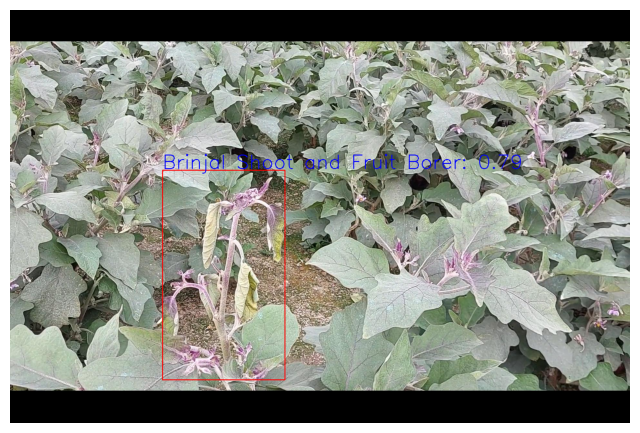

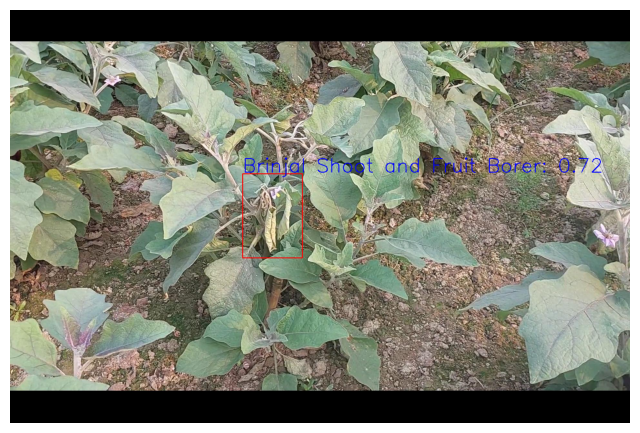

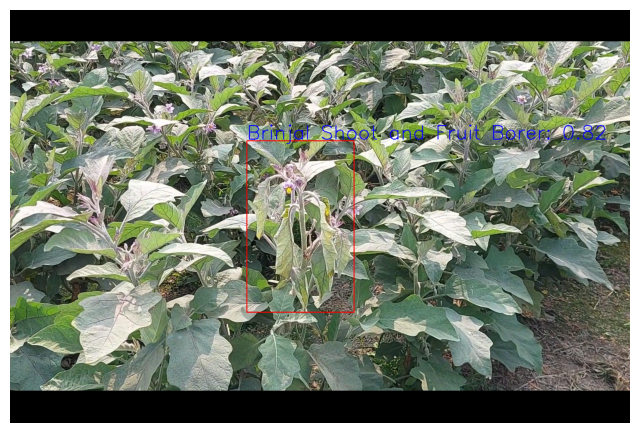

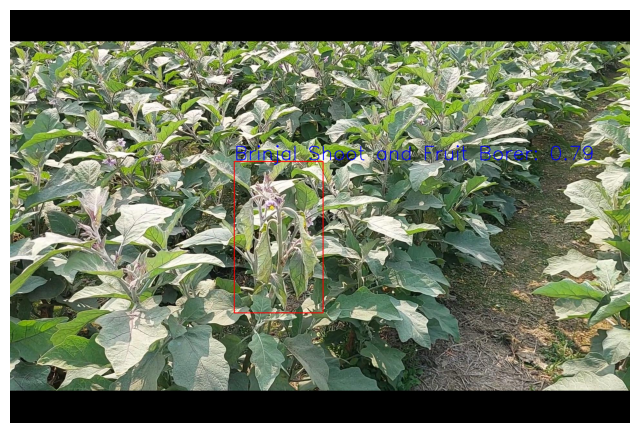

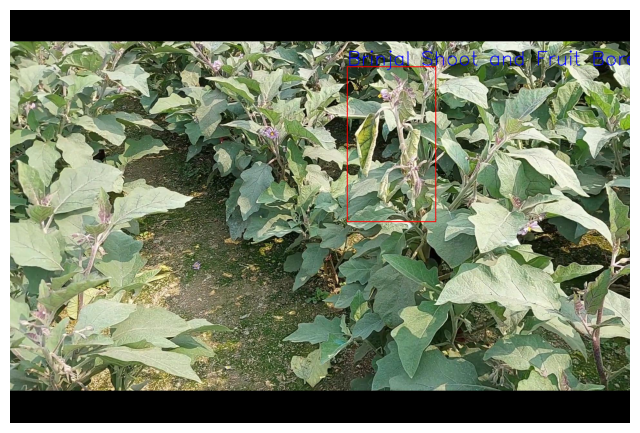

...

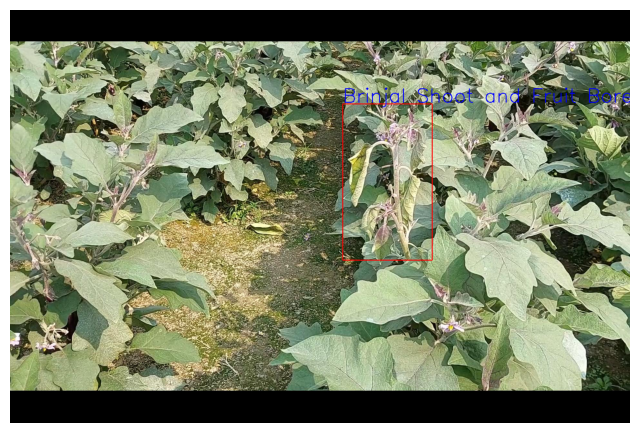

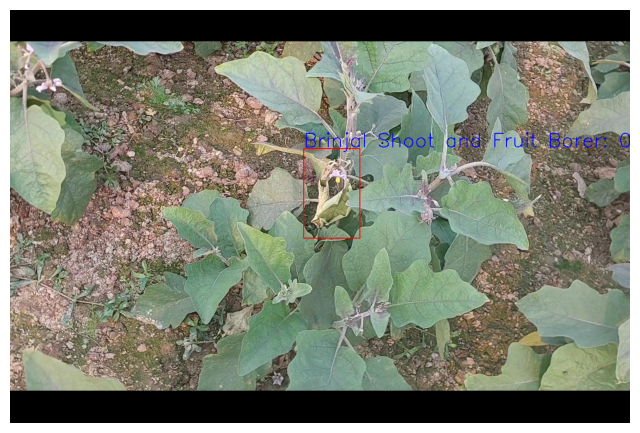

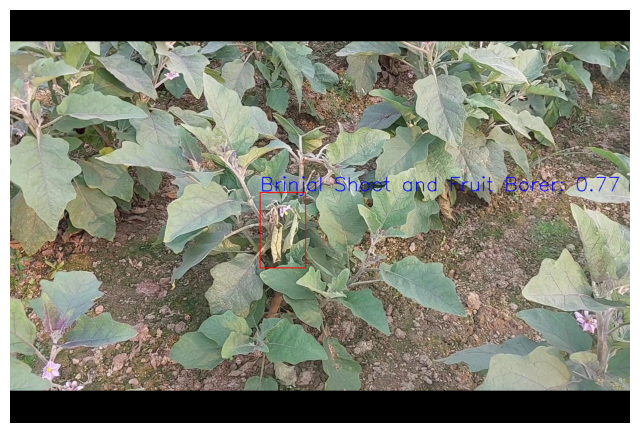

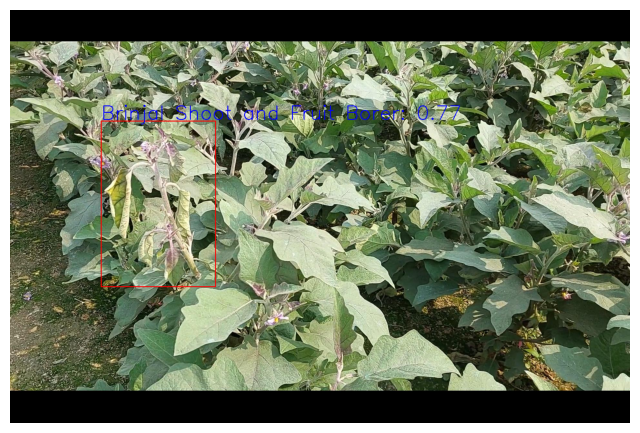

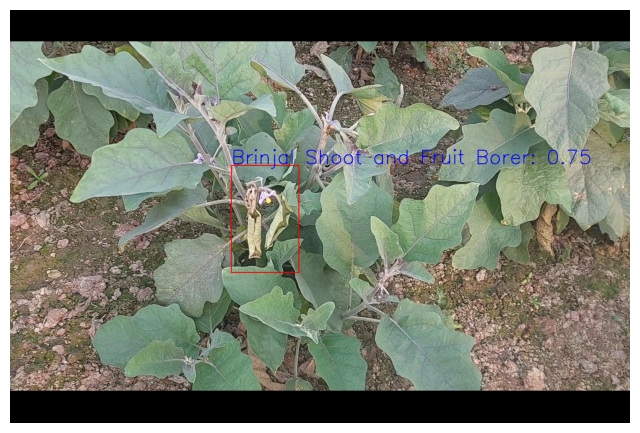

In [46]:
import cv2
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
from torchvision.ops import nms  # PyTorch NMS function for filtering overlapping detections

# Define class names (Modify according to your dataset)
CLASS_NAMES = ["Brinjal Shoot and Fruit Borer"]  # Update with actual class names used in training

# Function to apply Non-Maximum Suppression (NMS) to remove redundant overlapping boxes
def apply_nms(labels, scores, boxes, iou_threshold=0.5):
    if len(boxes) == 0:
        return [], [], []

    # Convert lists to NumPy arrays (ensure proper float dtype)
    boxes = np.array(boxes, dtype=np.float32)
    scores = np.array(scores, dtype=np.float32)

    # Convert to PyTorch tensors
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    scores_tensor = torch.tensor(scores, dtype=torch.float32)

    # Apply NMS and get indices of boxes to keep
    keep_indices = nms(boxes_tensor, scores_tensor, iou_threshold)

    # Keep only the selected boxes and corresponding labels and scores
    filtered_labels = [labels[i] for i in keep_indices]
    filtered_scores = [scores[i] for i in keep_indices]
    filtered_boxes = [boxes[i] for i in keep_indices]

    return filtered_labels, filtered_scores, filtered_boxes

# Function to draw bounding boxes and labels on images
def draw_predictions(image_path, labels, scores, boxes, save_path=None):
    image = cv2.imread(image_path)  # Load the image

    if image is None:
        print(f"Error: Could not read {image_path}")
        return

    # Apply NMS before drawing boxes to remove redundant detections
    labels, scores, boxes = apply_nms(labels, scores, boxes, iou_threshold=0.5)

    for label, score, box in zip(labels, scores, boxes):
        x1, y1, x2, y2 = map(int, box)  # Convert box coordinates to integers
        class_name = CLASS_NAMES[int(label)] if int(label) < len(CLASS_NAMES) else f"Class {label}"

        # Draw bounding box (Red color)
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 0, 255), 2)

        # Put label and confidence score (Blue color)
        text = f"{class_name}: {score:.2f}"
        cv2.putText(image, text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 2)

    # Display the image with bounding boxes
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct display
    plt.axis("off")
    plt.show()

    # Save annotated image if a save path is provided
    if save_path:
        cv2.imwrite(save_path, image)

# Directory to save results
output_dir = "/content/ensemble_results/"
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Loop through test images and draw predictions on them
for i, image_path in enumerate(image_paths):
    save_path = os.path.join(output_dir, f"ensemble_{i}.jpg")  # Define output image path
    draw_predictions(image_path, combined_labels[i], combined_scores[i], combined_boxes[i], save_path)